In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import gseapy as gp
from gseapy import Biomart
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib as mpl
import os
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=200, facecolor='white',fontsize=8,format= "pdf")
sc.settings.figdir = '.'
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

out_dir='/home/goubo/CRICK/CRICK/spaceA/fig'
os.chdir(out_dir)

scanpy==1.9.3 anndata==0.9.1 umap==0.5.4 numpy==1.23.5 scipy==1.12.0 pandas==2.1.4 scikit-learn==1.5.1 statsmodels==0.14.0 python-igraph==0.10.3 pynndescent==0.5.10


In [83]:
data_dir ='/home/goubo/CRICK/scpaRNA/stereo/processeddata'
timepoints=['E11.5','E12.5','E13.5','E14.5']
results_new_file=os.path.join(data_dir,'Mouse_embryo_all_stage_cellcycle.h5ad')


In [ ]:
if not os.path.exists(results_new_file):
    adata=sc.read_h5ad( os.path.join(data_dir,'Mouse_embryo_all_stage.h5ad'))
    adata=adata[adata.obs.timepoint.isin(timepoints)]
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    adata.var['mt'] = adata.var_names.str.startswith('mt-')
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
    adata = adata[adata.obs.pct_counts_mt < 20, :]

    sc.pp.normalize_total(adata, target_sum=1e4)
    # sc.pp.log1p(adata)
    sc.tl.pca(adata, svd_solver='arpack', n_comps=50)  # 执行PCA
    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50,use_rep='X_pca')
    sc.tl.umap(adata)
else:
    adata=sc.read_h5ad(results_new_file)

## Cell-Cycle Scoring and Regression

In [10]:
cell_cycle_genes = [x.strip() for x in open(
    '/home/goubo/CRICK/scpaRNA/regev_lab_cell_cycle_genes.txt')]

In [11]:
s_genes_human = cell_cycle_genes[:43]
g2m_genes_human = cell_cycle_genes[43:]
s_genes_human[1:5]

['PCNA', 'TYMS', 'FEN1', 'MCM2']

In [12]:

bm = Biomart(host="www.ensembl.org") #www.ensembl.org, asia.ensembl.org, useast.ensembl.org

queries_s_genes ={'external_gene_name': list(s_genes_human) } # need to be a dict object 
h2m_s_genes_results = bm.query(dataset='hsapiens_gene_ensembl',
            attributes=['ensembl_gene_id','external_gene_name',
                        'mmusculus_homolog_ensembl_gene',
                        'mmusculus_homolog_associated_gene_name'],
                        filters=queries_s_genes)


h2m_s_genes_results.head()

,ensembl_gene_id,external_gene_name,mmusculus_homolog_ensembl_gene,mmusculus_homolog_associated_gene_name
0,ENSG00000288475,CASP8AP2,NaN,NaN
1,ENSG00000278787,UBR7,NaN,NaN
2,ENSG00000176890,TYMS,ENSMUSG00000025747,Tyms
3,ENSG00000118412,CASP8AP2,ENSMUSG00000028282,Casp8ap2
4,ENSG00000159259,CHAF1B,ENSMUSG00000022945,Chaf1b


In [13]:
queries_g2m_genes ={'external_gene_name': list(g2m_genes_human) } # need to be a dict object 
h2m_g2m_genes_results = bm.query(dataset='hsapiens_gene_ensembl',
            attributes=['ensembl_gene_id','external_gene_name',
                        'mmusculus_homolog_ensembl_gene',
                        'mmusculus_homolog_associated_gene_name'],
                        filters=queries_g2m_genes)


h2m_g2m_genes_results.head()

,ensembl_gene_id,external_gene_name,mmusculus_homolog_ensembl_gene,mmusculus_homolog_associated_gene_name
0,ENSG00000136108,CKAP2,ENSMUSG00000037725,Ckap2
1,ENSG00000080986,NDC80,ENSMUSG00000024056,Ndc80
2,ENSG00000075218,GTSE1,ENSMUSG00000022385,Gtse1
3,ENSG00000088325,TPX2,ENSMUSG00000027469,Tpx2
4,ENSG00000175063,UBE2C,ENSMUSG00000001403,Ube2c


In [14]:
cell_cycle_genes_mouse=list(h2m_s_genes_results['mmusculus_homolog_associated_gene_name'] )+ list(h2m_g2m_genes_results['mmusculus_homolog_associated_gene_name'])
cell_cycle_genes_mouse[1:20]

[nan,
 'Tyms',
 'Casp8ap2',
 'Chaf1b',
 'Mcm5',
 'Cdc45',
 'Prim1',
 'Rrm1',
 'Mcm4',
 'Dscc1',
 'Blm',
 'Hells',
 'Ccne2',
 'Mcm2',
 'Rad51ap1',
 'Ung',
 nan,
 'Rad51',
 'Gins2']

In [15]:
cell_cycle_genes_filter = [x for x in cell_cycle_genes_mouse if x in adata.var_names]
len(cell_cycle_genes_filter)

94

In [16]:
sc.tl.score_genes_cell_cycle(adata, s_genes=h2m_s_genes_results['mmusculus_homolog_associated_gene_name'], 
g2m_genes=list(h2m_g2m_genes_results['mmusculus_homolog_associated_gene_name']))

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    484 total control genes are used. (0:00:26)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    439 total control genes are used. (0:00:15)
-->     'phase', cell cycle phase (adata.obs)


/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(val

/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


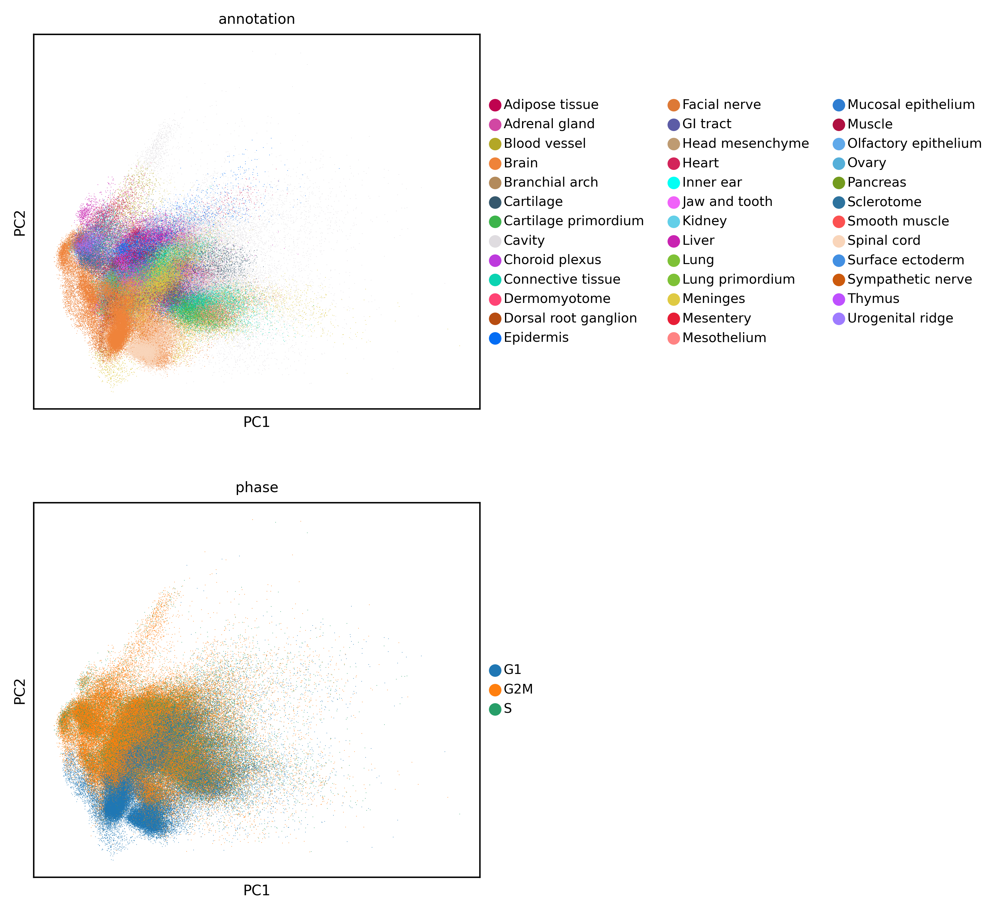

In [59]:
sc.pl.pca_scatter(adata, color=['annotation','phase'],
                  ncols=1,save='_S_G2M_score.pdf')

/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(val

/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


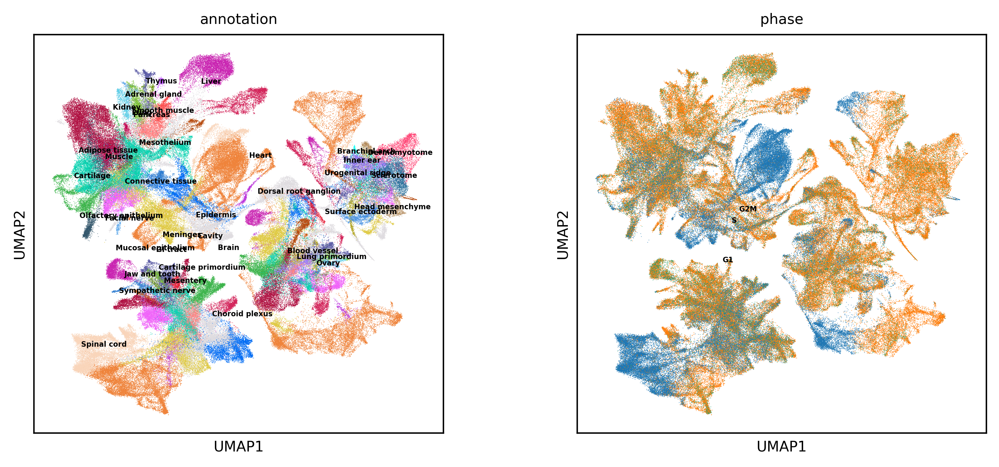

In [88]:
sc.pl.umap(adata, color=['annotation','phase'],legend_loc='on data',
           legend_fontsize=4,ncols=2,save='_S_G2M_score.pdf')

/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(val

/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


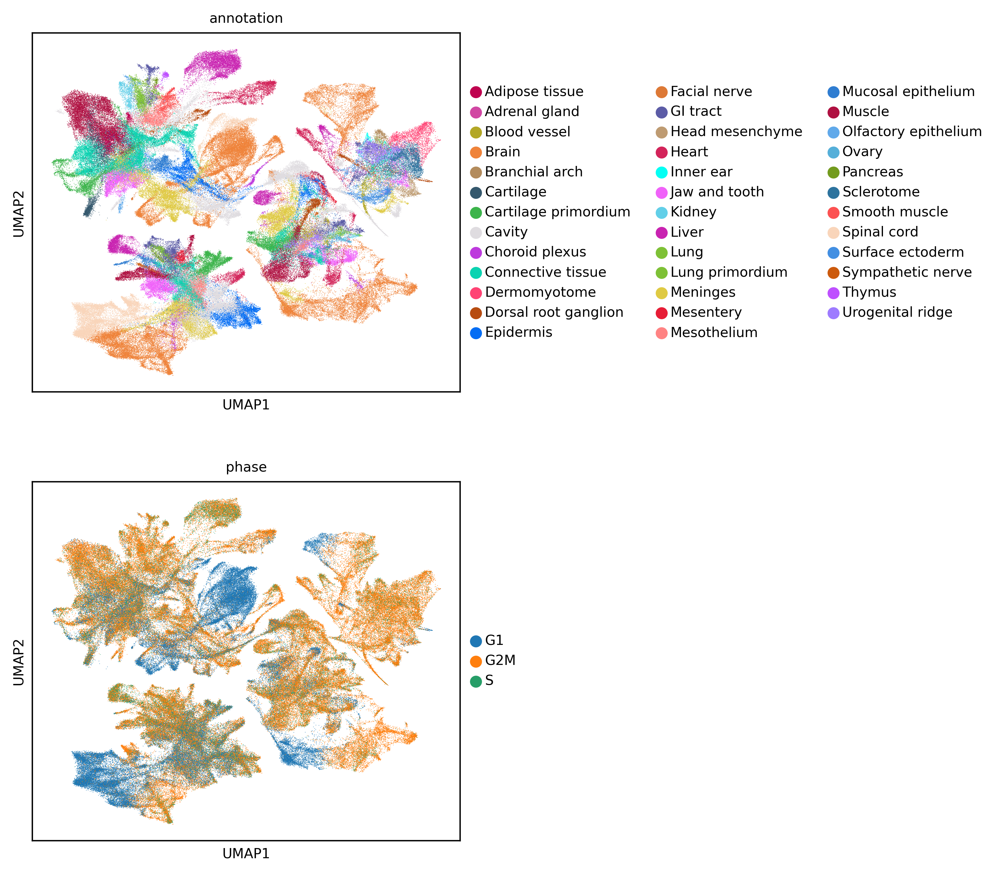

In [61]:
sc.pl.umap(adata, color=['annotation','phase'],
           legend_fontsize=8,ncols=1,save='_S_G2M_score_new.pdf')

In [21]:
S_score_sort=adata.obs.groupby(['annotation'])['S_score'].mean().sort_values(ascending=False).keys()

/tmp/ipykernel_2105105/2934100472.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  S_score_sort=adata.obs.groupby(['annotation'])['S_score'].mean().sort_values(ascending=False).keys()


/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


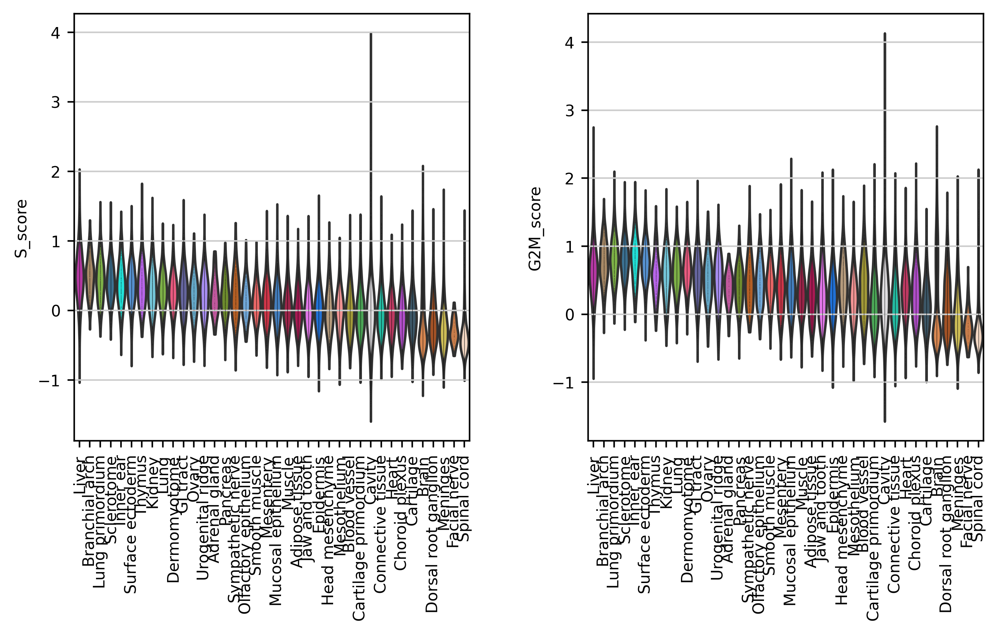

In [67]:
sc.pl.violin(adata, ['S_score','G2M_score'], groupby='annotation',jitter=0,
             rotation=90,size=0.1,order=S_score_sort,save='_S_G2M_score.pdf')

In [39]:
G2M_score_sort=adata.obs.groupby(['annotation'])['G2M_score'].mean().sort_values(ascending=False).keys()

/tmp/ipykernel_2105105/3976704128.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  G2M_score_sort=adata.obs.groupby(['annotation'])['G2M_score'].mean().sort_values(ascending=False).keys()


/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` paramet

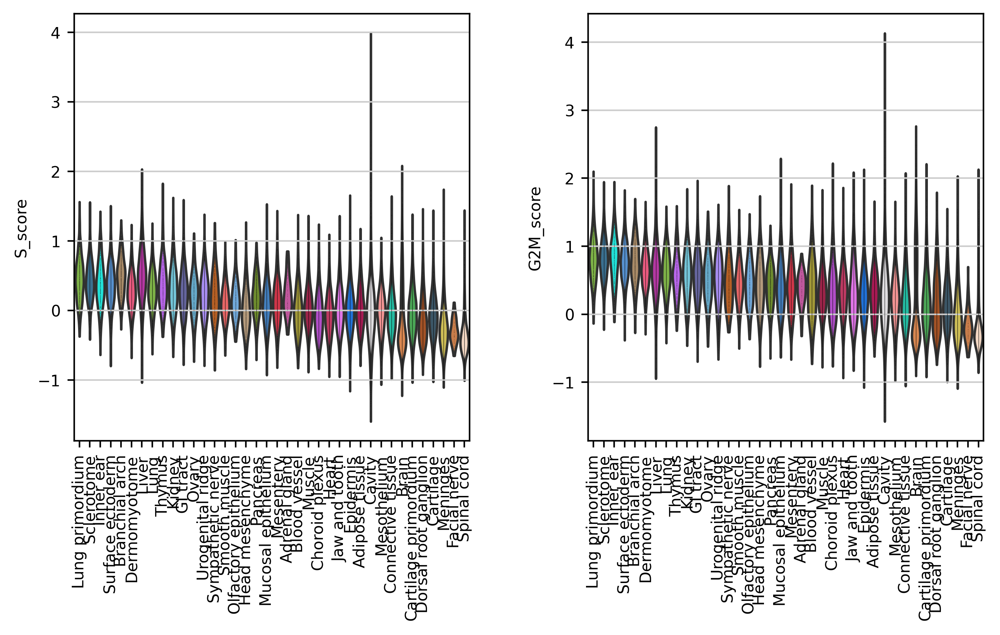

In [108]:
sc.pl.violin(adata, ['S_score','G2M_score'], groupby='annotation',jitter=0,
             rotation=90,size=0.1,order=G2M_score_sort,save='_S_G2M_score_sort_by_G2M_score.pdf')

/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.sc

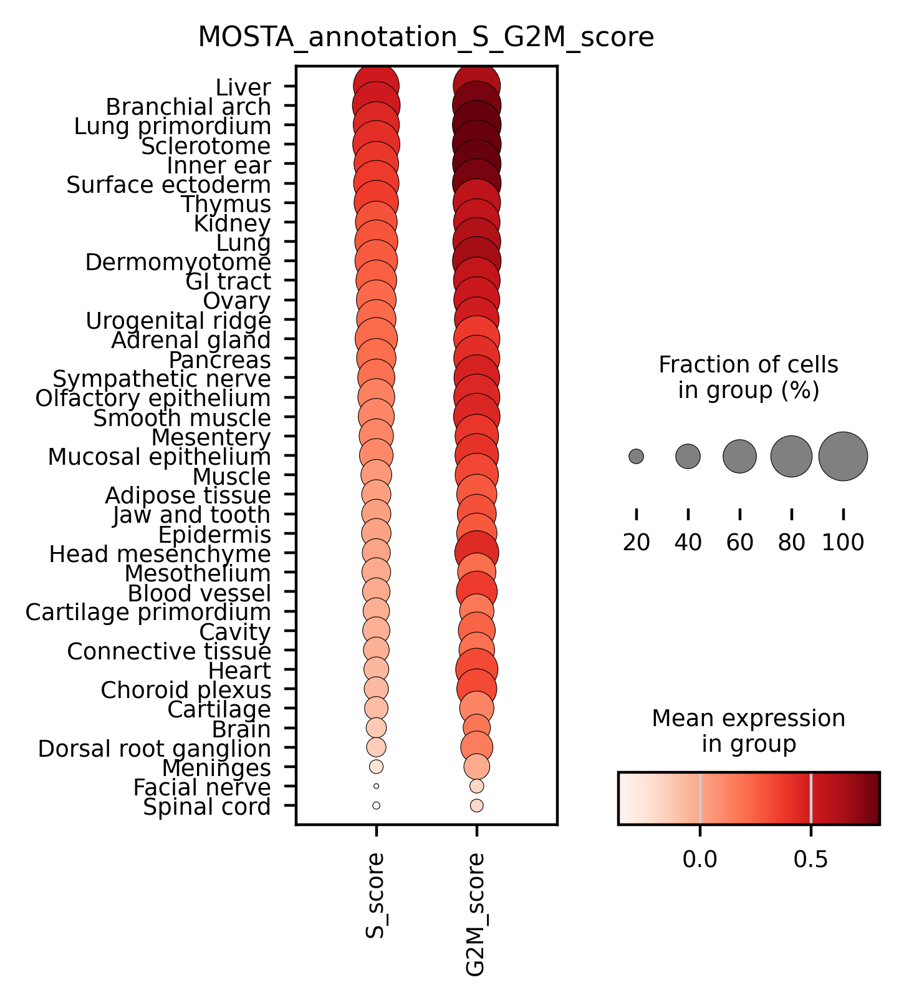

In [106]:
sc.pl.dotplot(adata, ['S_score','G2M_score',], groupby='annotation', figsize=(3,4),title='MOSTA_annotation_S_G2M_score',
              dendrogram=False, save='S_G2M_score.pdf',categories_order=S_score_sort)


/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.sc

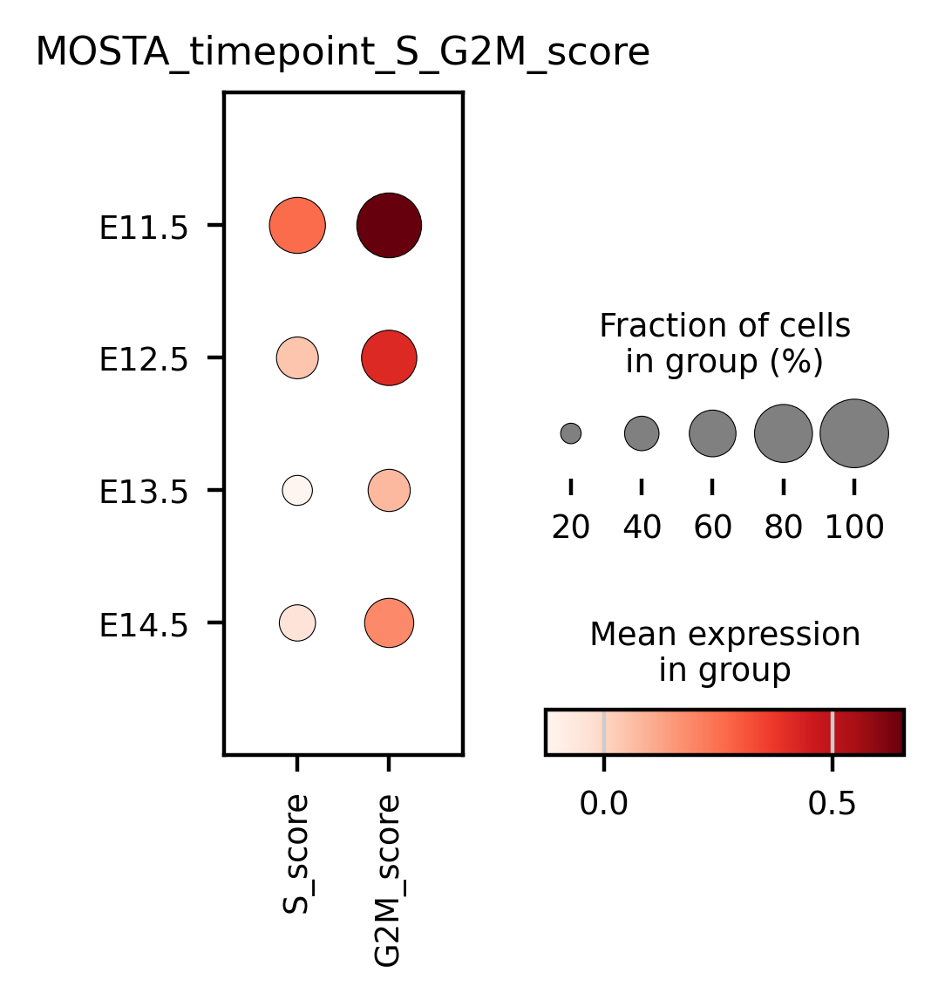

In [109]:
sc.pl.dotplot(adata, ['S_score','G2M_score'], groupby=['timepoint'],figsize=(2.5,2.5),title='MOSTA_timepoint_S_G2M_score',
              dendrogram=False, save='S_G2M_score_timepoint.pdf')


In [90]:
adata_E145=adata[adata.obs.timepoint=='E14.5']
adata_liver=adata[adata.obs.annotation=='Liver']



In [93]:
adata_E145_S_score_sort=adata_E145.obs.groupby(['annotation'])['S_score'].mean().sort_values(ascending=False).keys()

/tmp/ipykernel_2105105/1728910118.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_E145_S_score_sort=adata_E145.obs.groupby(['annotation'])['S_score'].mean().sort_values(ascending=False).keys()


/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.sc

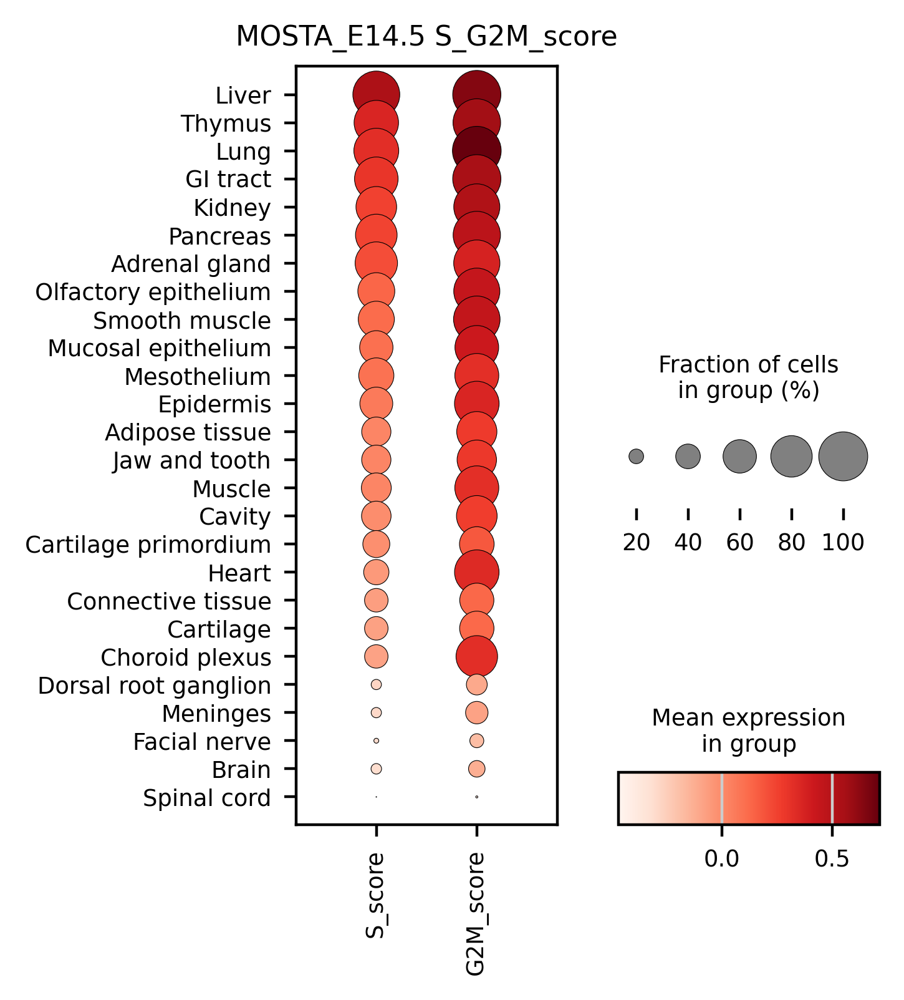

In [103]:
sc.pl.dotplot(adata_E145, ['S_score','G2M_score',], groupby='annotation',title='MOSTA_E14.5 S_G2M_score',
               figsize=(3,4),categories_order=adata_E145_S_score_sort, save='E14.5_S_G2M_score_timepoint.pdf')

/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/goubo/miniconda3/envs/squidpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.sc

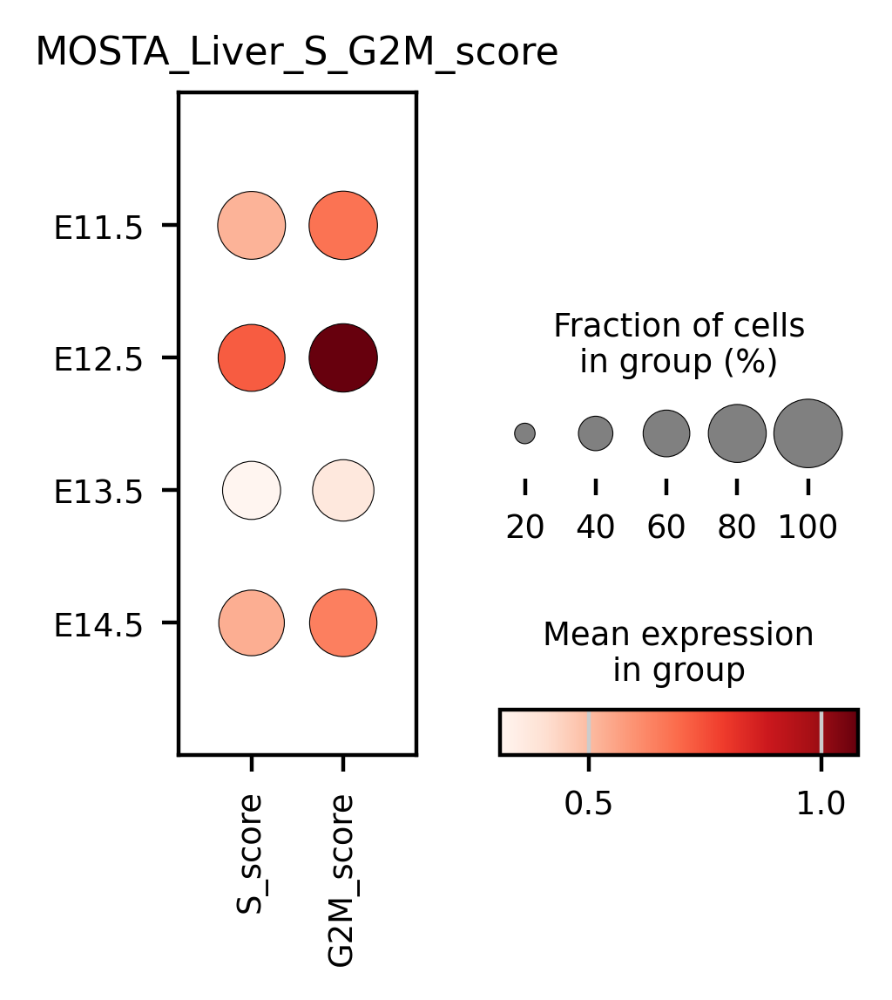

In [104]:
sc.pl.dotplot(adata_liver, ['S_score','G2M_score',], groupby='timepoint',title='MOSTA_Liver_S_G2M_score',
               figsize=(2.5,2.5), save='Liver_S_G2M_score_timepoint.pdf')

In [84]:
adata.write(results_new_file)